In [12]:
import librosa
import librosa.display
import os
from os import listdir
from os.path import isfile, join
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd


In [19]:
def convert_single_audio_to_image(audio_path, image_path):
    data, sr = librosa.load(audio_path, sr = 44100)
    display(ipd.Audio(data, rate=44100))

    window_width =  0.025 #25 ms  window size 
    sliding = 0.01 #10ms stride 
    spec = librosa.feature.melspectrogram(y=data, sr=sr, n_fft = int(window_width*sr), hop_length =int(sliding*sr), fmax=sr/2)
    
    #Convert amplitude to decibels
    db_spec = librosa.power_to_db(spec, ref=np.max)
    
    for x in range(0, np.size(db_spec,1),300):
        fig = plt.figure()
        ax = plt.axes()
        
        #if there is no more data, slide a bit backwards
        if(x+300 > np.size(db_spec,1)):
            limit = np.size(db_spec,1)
            librosa.display.specshow(np.reshape(np.copy(db_spec[:,limit-300:limit]),(128,-1)), sr=sr, hop_length =int(sliding*sr),fmax=sr/2, x_axis='time',y_axis='mel')
        else:
            librosa.display.specshow(np.reshape(np.copy(db_spec[:,x:x+300]),(128,-1)), sr=sr, hop_length =int(sliding*sr),fmax=sr/2, x_axis='time',y_axis='mel')
        
        plt.colorbar()
        file_end = "%d.png" %(x)
        fig.savefig(image_path.replace('.png',file_end),bbox_inches='tight', transparent=True, pad_inches=0.0)
        #fig.savefig(image_path.replace('.png',file_end))
        plt.show()
        plt.close(fig)


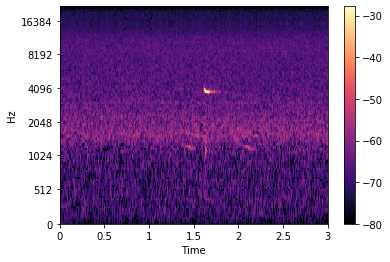

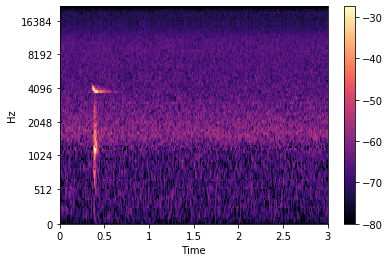

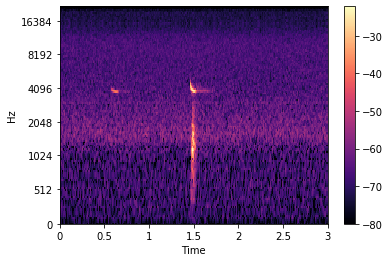

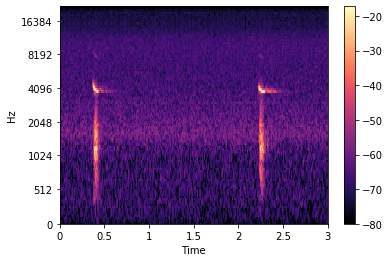

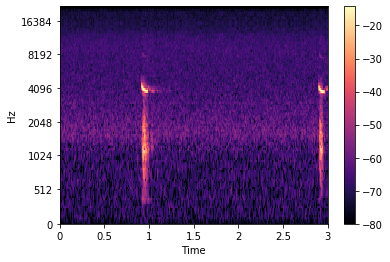

...

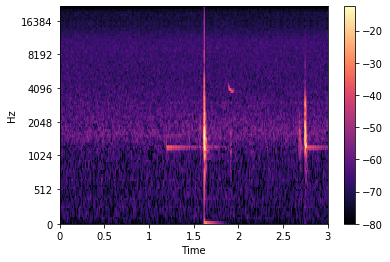

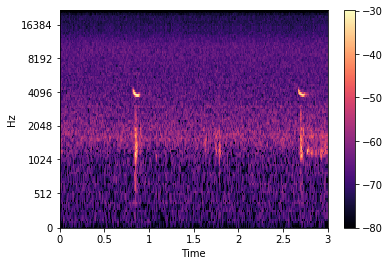

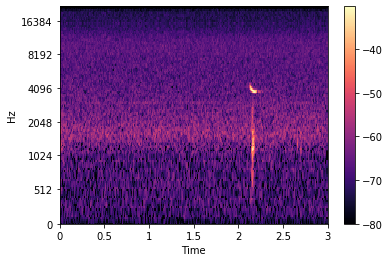

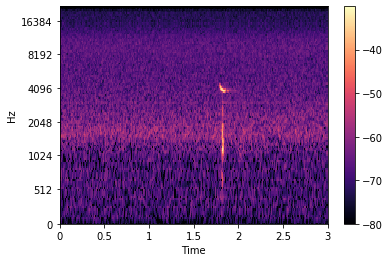

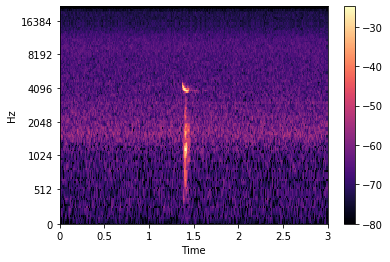

In [20]:
audio_folder_name= r"..\..\data\Identified calls"
image_folder_name=  r"..\..\data\TrialAugmentations"

f_name='PIPKUH_002_20180128_D240.wav'
audio_path = join(audio_folder_name,'Pipistrellus kuhli','PIPKUH_002_20180128_D240.wav')
f_name = f_name.upper()
image_path = join(image_folder_name,f_name.replace('.WAV', '.png'))
convert_single_audio_to_image(audio_path,image_path)

In [31]:
def stretch(data, rate=1, input_length=16000):
    data = librosa.effects.time_stretch(data, rate)
    if len(data)>input_length:
        data = data[:input_length]
    else:
        data = np.pad(data, (0, max(0, input_length - len(data))), "constant")

    return data


def augment_audio(audio_path, image_path):
    data, sr = librosa.load(audio_path, sr = 44100)
    aug_data = stretch(data, 0.5,data.shape[0])
    print(aug_data.shape)
    display(ipd.Audio(aug_data, rate=44100))

    window_width =  0.025 #25 ms  window size 
    sliding = 0.01 #10ms stride 
    
    spec = librosa.feature.melspectrogram(y=aug_data, sr=sr, n_fft = int(window_width*sr), hop_length =int(sliding*sr), fmax=sr/2)
    
    #Convert amplitude to decibels
    db_spec = librosa.power_to_db(spec, ref=np.max)
    
    for x in range(0, np.size(db_spec,1),300):
        fig = plt.figure()
        ax = plt.axes()
        
        #if there is no more data, slide a bit backwards
        if(x+300 > np.size(db_spec,1)):
            limit = np.size(db_spec,1)
            librosa.display.specshow(np.reshape(np.copy(db_spec[:,limit-300:limit]),(128,-1)), sr=sr, hop_length =int(sliding*sr),fmax=sr/2, x_axis='time',y_axis='mel')
        else:
            librosa.display.specshow(np.reshape(np.copy(db_spec[:,x:x+300]),(128,-1)), sr=sr, hop_length =int(sliding*sr),fmax=sr/2, x_axis='time',y_axis='mel')
        
        plt.colorbar()
        file_end = "%d.png" %(x)
        fig.savefig(image_path.replace('.png',file_end))
        plt.show()
        plt.close(fig)


(1562880,)


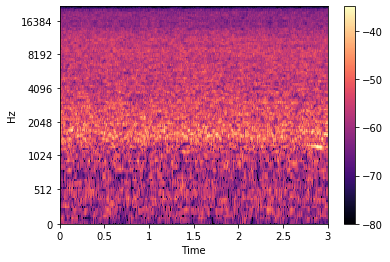

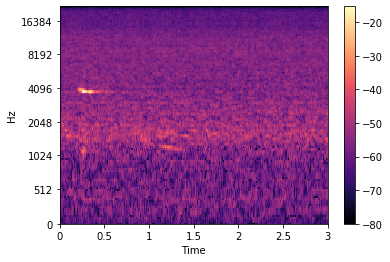

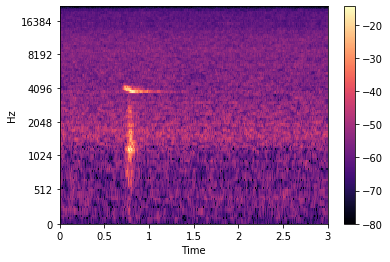

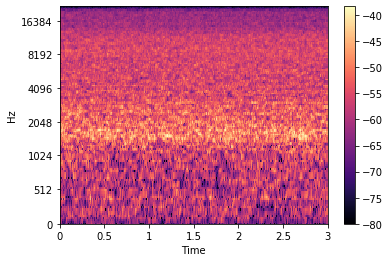

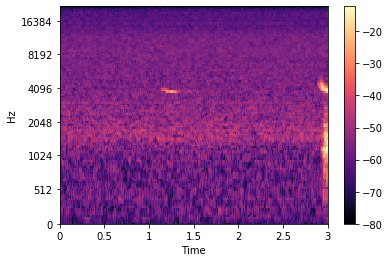

...

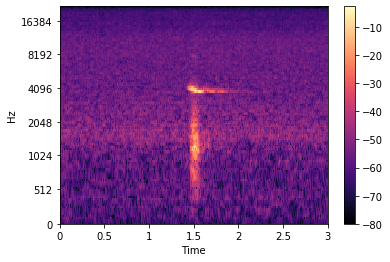

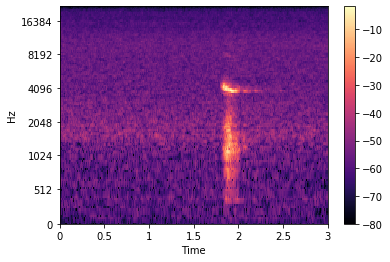

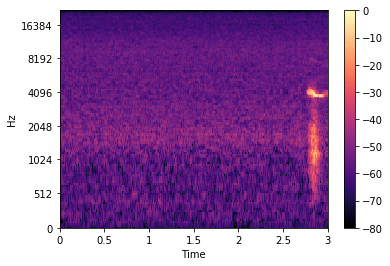

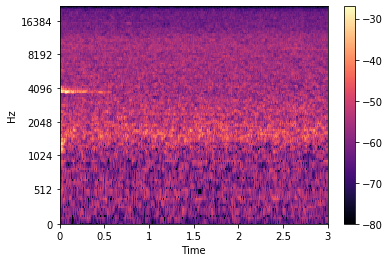

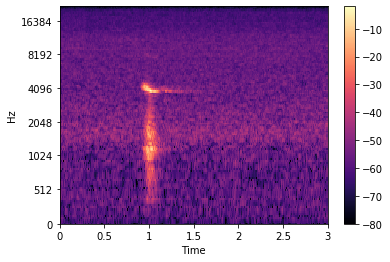

In [33]:
audio_folder_name= r"..\..\data\Identified calls"
image_folder_name=  r"..\..\data\TrialAugmentations\TS0.5"

f_name='PIPKUH_002_20180128_D240.wav'
audio_path = join(audio_folder_name,'Pipistrellus kuhli','PIPKUH_002_20180128_D240.wav')
f_name = f_name.upper()
image_path = join(image_folder_name,f_name.replace('.WAV', '.png'))
augment_audio(audio_path,image_path)